In [1]:
import numpy as np
import matplotlib 
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd
import xarray as xr
import cartopy.crs as ccrs
import dask
import json

#from IPython.display import display, HTML
from loadCMIP6data import *

from scipy.ndimage import gaussian_filter

import sys
p = os.path.abspath('../..')
if p not in sys.path:
    sys.path.append(p)
from tools.e5tools import *
from scipy.stats import linregress

In [84]:
def plot_timeseries(ts,ax,lbl,clr,lw=1,unit='mm/day',print_float='f',sampling = 1,relative_change=False):
    timeidxs=np.arange(len(ts))
    reg = linregress(timeidxs,ts)
    meanvalue=ts.mean()
    if reg.pvalue<0.05:
        if relative_change:
            lbl=lbl+' '+r"$\bf{%.3f pct/decade, p=%.3f}$"%(10*sampling*reg.slope/meanvalue*100,reg.pvalue)
        else:
            if print_float=='f':
                lbl=lbl+' '+r"$\bf{%.3f %s/decade, p=%.3f}$"%(10*sampling*reg.slope,unit,reg.pvalue)
            elif print_float=='e':
                lbl=lbl+' '+r"$\bf{%.1e %s/decade, p=%.3f}$"%(10*sampling*reg.slope,unit,reg.pvalue)
    else:
        if relative_change:
            lbl=lbl+' '+"%.3f pct/decade, p=%.3f"%(10*sampling*reg.slope/meanvalue*100,reg.pvalue)
        else:
            if print_float=='f':
                lbl=lbl+' '+"%.3f %s/decade, p=%.3f"%(10*sampling*reg.slope,unit,reg.pvalue)
            elif print_float=='e':
                lbl=lbl+' '+"%.1e %s/decade, p=%.3f"%(10*sampling*reg.slope,unit,reg.pvalue)
    ts.plot(ax=ax,label=lbl,color=clr)
    ax.plot(ts.time,reg.intercept+timeidxs*reg.slope,linestyle='--',linewidth=lw,color=clr)
    ax.set_ylabel(unit)
    ax.legend()
    if relative_change:
        return 10*sampling*reg.slope/meanvalue*100
    else:
        return 10*sampling*reg.slope

In [3]:
mountains=         {"vietnam"    :([102,115,10,19.5],"Annamite range (Vietnam)",240,10),
                    "ghats"      :([68,80,7.5,17]   ,"Western Ghats"           ,70 ,6 ),
                    "madagascar" :([40,60,-25,-12]  ,"Madagascar"              ,280,3 ),
                    "myanmar"    :([80,102,7,27]    ,"Myanmar"                 ,60 ,7 ),
                    "newbritain" :([148,155,-12,0]  ,"New Britain"             ,320,7 ),
                    "philippines":([118,130,10,22]  ,"Philippines"             ,225,12),
                    "sumatra"    :([90,110,-6,6]    ,"Bukit Barisan (Sumatra)" ,70 ,11),
                    "malaysia"   :([97,107,1,10]    ,"Malaysia"                ,225,11),
                   }

precip_boxes = {"vietnam"    :[107  ,  19  , 110.5, 14   ,2  ],
                "ghats"      :[ 75  ,   9  ,  72.5, 16   ,2  ],
                "madagascar" :[ 52  , -14.5,  49  , -24.5,2.5],
                "myanmar"    :[ 98  ,  11  ,  90  , 21   ,4  ],
                "newbritain" :[154  , - 6  , 150  , -8   ,2  ],
                "philippines":[123.5,  19  , 127  , 11   ,3  ],
                "sumatra"    :[ 98.5, - 2  ,  96  , 2    ,2.5],
                "malaysia"   :[100.5,  10  , 105  , 4    ,2  ],
               }
mnths=['jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec']

In [4]:
def tilted_rect(grid,x1,y1,x2,y2,width,reverse=False):
    x = grid.lon
    y = grid.lat
    if reverse:
        halfplane_para = (x-x1)*(y2-y1) - (x2-x1)*(y-y1) <=0
    else:
        halfplane_para = (x-x1)*(y2-y1) - (x2-x1)*(y-y1) >=0
    sc_prod = (x-x1)*(x2-x1)+(y-y1)*(y2-y1)
    halfplane_perp_up = sc_prod >= 0
    halfplane_perp_dn = (x-x2)*(x1-x2)+(y-y2)*(y1-y2) >= 0
    distance_across = np.sqrt((x-x1)**2+(y-y1)**2 - sc_prod**2/((x2-x1)**2+(y2-y1)**2))
    return (halfplane_para*halfplane_perp_up*halfplane_perp_dn*(distance_across<width)).transpose('lat','lon')
def crossslopeflow(u,v,angle):
    return (u*np.sin(angle*np.pi/180)+v*np.cos(angle*np.pi/180))
    

# Global Precipitation trends

In [43]:
#%%time
#modellist_pr, modelnames_pr = checkModels('ScenarioMIP','ssp585','Amon','pr',1,False)#'CMIP','1pctCO2'
#modellist_pr, modelnames_pr = checkYears(modellist_pr, modelnames_pr,2015,2099,nminens=1,verbose=False)
#with open("/global/cscratch1/sd/qnicolas/temp/modellist_pr_2015_2100.txt","w") as f:
#    json.dump(modellist_pr, f)
#modelnames_pr.to_csv("/global/cscratch1/sd/qnicolas/temp/modelnames_pr_2015_2100.csv")

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'pr' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'pr' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,


CPU times: user 13.6 s, sys: 1.09 s, total: 14.6 s
Wall time: 51.2 s


In [5]:
with open("/global/cscratch1/sd/qnicolas/temp/modellist_pr_2015_2100.txt","r") as f:
    modellist_pr = json.load(f)
modelnames_pr = pd.read_csv("/global/cscratch1/sd/qnicolas/temp/modelnames_pr_2015_2100.csv")

In [6]:
pr_SSP585 = loadData(modellist_pr,'pr',chunks={'time':50})
pr_SSP585[8]=pr_SSP585[8][:,:1032] # drop values after 2100
pr_st=loadMonthMMM2D(pr_SSP585,"2015","2034")
pr_en=loadMonthMMM2D(pr_SSP585,"2080","2099")

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'pr' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'pr' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,


In [5]:
#%%time
#for name,prm in zip(modelnames['Included models'],pr_SSP585):
#    print(name)
#    prm_mean=86400*spatial_mean(prm.mean('ensmember'),mask=None,lat='lat',lon='lon').load()
#    prm_mean['time'] = prm_mean.indexes['time'].to_datetimeindex()
#    filename="/global/cscratch1/sd/qnicolas/temp/"+name+"_globmeanpr.nc"
#    if not os.path.exists(os.path.dirname(filename)):
#        os.mkdir(os.path.dirname(filename))
#    prm_mean.to_netcdf(filename)

prmean_allmodels = []
for name,prm in zip(modelnames['Included models'],pr_SSP585):
    prmean_allmodels.append(xr.open_dataarray("/global/cscratch1/sd/qnicolas/temp/"+name+"_globmeanpr.nc"))
    


## Mean pr trends

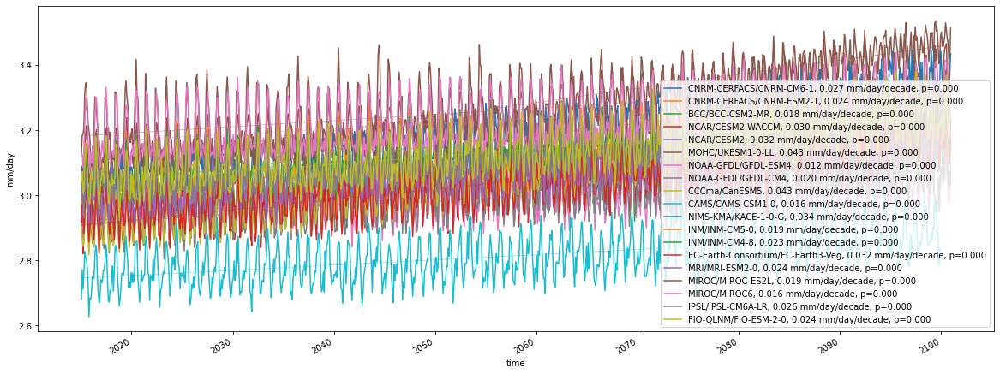

In [15]:
# Mean precip trend
_,ax=plt.subplots(1,1,figsize=(20,7))
cycle=plt.rcParams["axes.prop_cycle"].by_key()["color"]
for i,(name,prmodel) in enumerate(zip(modelnames['Included models'],prmean_allmodels)):
    plot_timeseries(prmodel,ax,name,cycle[i%10],0.5,sampling = 12)
#ax.set_xlim(pd.to_datetime("2010-01-01"),pd.to_datetime("2130-01-01"))

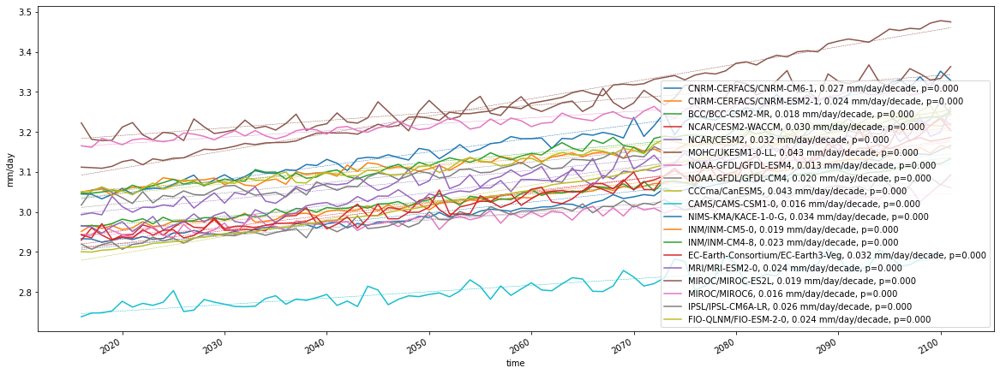

In [16]:
# Mean precip trend
_,ax=plt.subplots(1,1,figsize=(20,7))
cycle=plt.rcParams["axes.prop_cycle"].by_key()["color"]
for i,(name,prmodel) in enumerate(zip(modelnames['Included models'],prmean_allmodels)):
    plot_timeseries(prmodel.resample(time='1Y').mean(),ax,name,cycle[i%10],0.5,sampling = 1)
#ax.set_xlim(pd.to_datetime("2010-01-01"),pd.to_datetime("2130-01-01"))

## Orog pr trends

In [6]:
orog = xr.open_dataset(CMIP6_FOLDER+"ERA5/e5.oper.invariant/197901/e5.oper.invariant.128_129_z.ll025sc.1979010100_1979010100.nc").Z.isel(time=0)/9.80665
m_per_degreelat = 6370*1e3*np.pi/180
onebyonegrid = xr.DataArray(np.zeros((180,360)),coords={'latitude':np.arange(-89.5,90,1),'longitude':np.arange(0.5,360,1)},dims=['latitude','longitude'])
orog_onebyone = orog.interp_like(onebyonegrid)
ddxorog = orog_onebyone.differentiate("longitude")/(m_per_degreelat*(np.cos(orog_onebyone.latitude*np.pi/180.)+1e-5))
ddyorog = orog_onebyone.differentiate("latitude")/m_per_degreelat
slope=np.sqrt(ddxorog**2+ddyorog**2)
slope_s  = xr.apply_ufunc(gaussian_filter,slope  ,kwargs={"sigma":.5})

In [7]:
landmask = xr.open_dataset(CMIP6_FOLDER+"ERA5/e5.oper.invariant/197901/e5.oper.invariant.128_172_lsm.ll025sc.1979010100_1979010100.nc").LSM[0]
sort_inds = {"latitude": np.argsort(landmask["latitude"].values)}
landmask_cmip = landmask.isel(**sort_inds).rename(latitude='lat',longitude='lon')

In [8]:
def slope_mask_cmip(grid,original_slope):
    sort_inds = {"latitude": np.argsort(original_slope["latitude"].values)}
    original_slope = original_slope.isel(**sort_inds).rename(latitude='lat',longitude='lon')
    return 1*((1*(original_slope>2e-3)).interp_like(grid)>0.3)

In [9]:
#for name,prm in zip(modelnames['Included models'],pr_SSP585):
#    print(name)
#    prm_mean = 86400*spatial_mean(prm.mean('ensmember'),mask=landmask_cmip.interp_like(prm),lat='lat',lon='lon').load()
#    prm_mean['time'] = prm_mean.indexes['time'].to_datetimeindex()
#    filename="/global/cscratch1/sd/qnicolas/temp/"+name+"_landmeanpr.nc"
#    if not os.path.exists(os.path.dirname(filename)):
#        os.mkdir(os.path.dirname(filename))
#    prm_mean.to_netcdf(filename)
prland_allmodels = []
for name,prm in zip(modelnames['Included models'],pr_SSP585):
    prland_allmodels.append(xr.open_dataarray("/global/cscratch1/sd/qnicolas/temp/"+name+"_landmeanpr.nc"))
    

In [10]:
#for name,prm in zip(modelnames['Included models'],pr_SSP585):
#    print(name)
#    prm_mean = 86400*spatial_mean(prm.mean('ensmember'),mask=slope_mask_cmip(prm,slope_s),lat='lat',lon='lon').load()
#    prm_mean['time'] = prm_mean.indexes['time'].to_datetimeindex()
#    filename="/global/cscratch1/sd/qnicolas/temp/"+name+"_orogmeanpr.nc"
#    if not os.path.exists(os.path.dirname(filename)):
#        os.mkdir(os.path.dirname(filename))
#    prm_mean.to_netcdf(filename)
prorog_allmodels = []
for name,prm in zip(modelnames['Included models'],pr_SSP585):
    prorog_allmodels.append(xr.open_dataarray("/global/cscratch1/sd/qnicolas/temp/"+name+"_orogmeanpr.nc"))

In [11]:
orogshare_allmodels = []
for name,prm in zip(modelnames['Included models'],pr_SSP585):
    orogshare_allmodels.append(spatial_mean(slope_mask_cmip(prm,slope_s),lat='lat',lon='lon'))
orogshareland_allmodels = []    
for name,prm in zip(modelnames['Included models'],pr_SSP585):
    orogshareland_allmodels.append(spatial_mean(slope_mask_cmip(prm,slope_s),mask=landmask_cmip.interp_like(prm),lat='lat',lon='lon'))


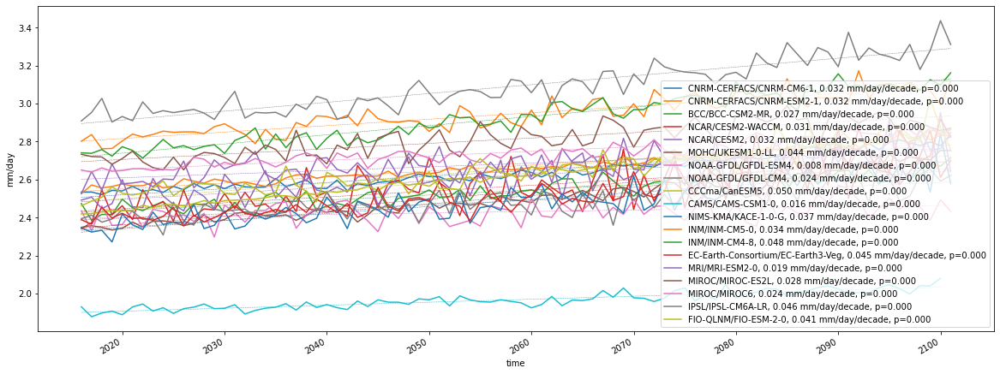

In [11]:
# Orog precip trend
_,ax=plt.subplots(1,1,figsize=(20,7))
cycle=plt.rcParams["axes.prop_cycle"].by_key()["color"]
for i,(name,prmodel) in enumerate(zip(modelnames['Included models'],prorog_allmodels)):
    plot_timeseries(prmodel.resample(time='1Y').mean(),ax,name,cycle[i%10],0.5,sampling = 1)
#ax.set_xlim(pd.to_datetime("2010-01-01"),pd.to_datetime("2130-01-01"))

Text(0.5, 1.0, 'Share of orographic precip over whole globe')

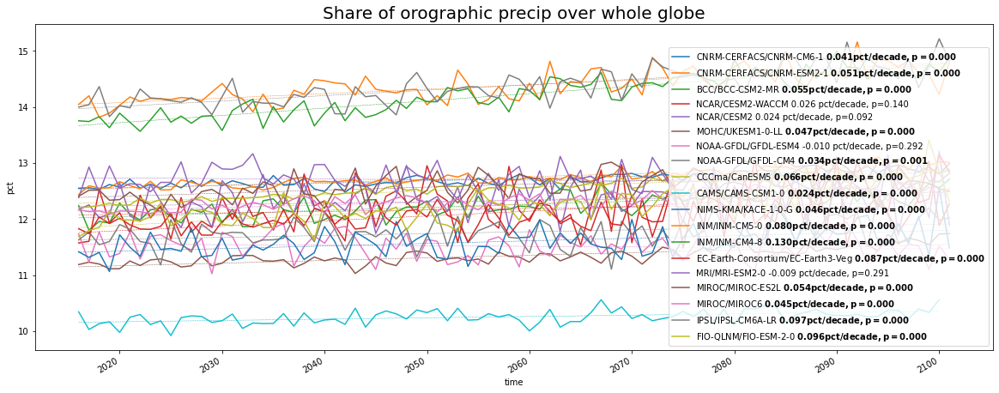

In [56]:
# trend in share of orog precip 
_,ax=plt.subplots(1,1,figsize=(20,7))
cycle=plt.rcParams["axes.prop_cycle"].by_key()["color"]
for i,(name,prorogmodel,prmodel,orogshare) in enumerate(zip(modelnames['Included models'],prorog_allmodels,prmean_allmodels,orogshare_allmodels)):
    plot_timeseries(100*prorogmodel.resample(time='1Y').mean()/prmodel.resample(time='1Y').mean()*orogshare,ax,name,cycle[i%10],0.5,unit='pct',sampling = 1)
#ax.set_xlim(pd.to_datetime("2010-01-01"),pd.to_datetime("2130-01-01"))
ax.set_title("Share of orographic precip over whole globe",fontsize=20)

Text(0.5, 1.0, 'Share of orographic precip over land')

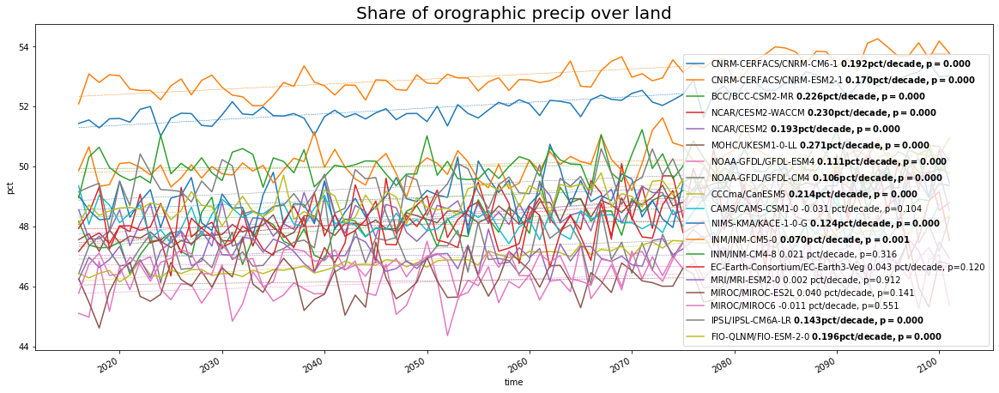

In [57]:
# trend in share of orog precip 
_,ax=plt.subplots(1,1,figsize=(20,7))
cycle=plt.rcParams["axes.prop_cycle"].by_key()["color"]
for i,(name,prorogmodel,prlandmodel,orogshare) in enumerate(zip(modelnames['Included models'],prorog_allmodels,prland_allmodels,orogshareland_allmodels)):
    plot_timeseries(100*prorogmodel.resample(time='1Y').mean()/prlandmodel.resample(time='1Y').mean()*orogshare,ax,name,cycle[i%10],0.5,unit='pct',sampling = 1)
ax.set_title("Share of orographic precip over land", fontsize=20)

# Precipitation trends in tropical orographic regions

## Maps

In [15]:
cesm2_orog = xr.open_dataset("/global/cfs/projectdirs/m3522/cmip6/CMIP6/ScenarioMIP/NCAR/CESM2/ssp585/r1i1p1f1/fx/orog/gn/v20190730/orog_fx_CESM2_ssp585_r1i1p1f1_gn.nc").orog

In [17]:
cccma_orog = xr.open_dataset("/global/cfs/projectdirs/m3522/cmip6/CMIP6/ScenarioMIP/CCCma/CanESM5/ssp585/r1i1p2f1/fx/orog/gn/v20190429/orog_fx_CanESM5_ssp585_r1i1p2f1_gn.nc").orog

In [23]:
ecearth_orog = xr.open_dataset("/global/cfs/projectdirs/m3522/cmip6/CMIP6/ScenarioMIP/EC-Earth-Consortium/EC-Earth3/ssp245/r2i1p1f1/Emon/orog/gr/v20191022/orog_Emon_EC-Earth3_ssp245_r2i1p1f1_gr_205401-205412.nc").orog[0]

In [57]:
%%time
pr_cesm2 = pr_SSP585[4]
pr_cesm2_st = 86400*pr_cesm2.sel(time=((pr_cesm2["time.year"]>=2015) & (pr_cesm2["time.year"]<2035))).groupby('time.month').mean(['time','ensmember']).persist()
pr_cesm2_en = 86400*pr_cesm2.sel(time=((pr_cesm2["time.year"]>=2080) & (pr_cesm2["time.year"]<2100))).groupby('time.month').mean(['time','ensmember']).persist()

pr_cccma = pr_SSP585[8]
pr_cccma_st = 86400*pr_cccma.sel(time=((pr_cccma["time.year"]>=2015) & (pr_cccma["time.year"]<2035))).groupby('time.month').mean(['time','ensmember']).persist()
pr_cccma_en = 86400*pr_cccma.sel(time=((pr_cccma["time.year"]>=2080) & (pr_cccma["time.year"]<2100))).groupby('time.month').mean(['time','ensmember']).persist()

pr_ecearth = pr_SSP585[13]
pr_ecearth_st = 86400*pr_ecearth.sel(time=((pr_ecearth["time.year"]>=2015) & (pr_ecearth["time.year"]<2035))).groupby('time.month').mean(['time','ensmember']).persist()
pr_ecearth_en = 86400*pr_ecearth.sel(time=((pr_ecearth["time.year"]>=2080) & (pr_ecearth["time.year"]<2100))).groupby('time.month').mean(['time','ensmember']).persist()

CPU times: user 16.4 s, sys: 4.73 s, total: 21.2 s
Wall time: 13.5 s


In [ ]:
fig,ax = plt.subplots(2,4,figsize=(25,11),subplot_kw={"projection":ccrs.PlateCarree()})
ax = ax.reshape(-1)
for i,name in enumerate(mountains):
    box,Lname,_,mnth = mountains[name]
    ax[i].coastlines()
    window=cesm2_orog.sel(lon=slice(box[0],box[1]),lat=slice(box[2],box[3]))
    window.plot(ax=ax[i],transform=ccrs.PlateCarree(),cmap=plt.cm.terrain,levels=np.arange(0,2001,100))
    ax[i].set_title(Lname)
    tilted_rect(window,*precip_boxes[name]).plot.contour(ax=ax[i],levels=[0.5],colors='w')
fig.suptitle("CESM2 topography",fontsize=20);None

fig,ax = plt.subplots(2,4,figsize=(25,11),subplot_kw={"projection":ccrs.PlateCarree()})
ax = ax.reshape(-1)
for i,name in enumerate(mountains):
    box,Lname,_,mnth = mountains[name]
    ax[i].coastlines()
    window=pr_cesm2_st.sel(lon=slice(box[0],box[1]),lat=slice(box[2],box[3]),month=mountains[name][3])
    window.plot(ax=ax[i],transform=ccrs.PlateCarree(),cbar_kwargs={'label':'pr (mm/day)'})
    ax[i].set_title(Lname)
    tilted_rect(window,*precip_boxes[name]).plot.contour(ax=ax[i],levels=[0.5],colors='w')
fig.suptitle("CESM2 2015-2035 pr",fontsize=20);None

fig,ax = plt.subplots(2,4,figsize=(25,11),subplot_kw={"projection":ccrs.PlateCarree()})
ax = ax.reshape(-1)
for i,name in enumerate(mountains):
    box,Lname,_,mnth = mountains[name]
    ax[i].coastlines()
    window_st=pr_cesm2_st.sel(lon=slice(box[0],box[1]),lat=slice(box[2],box[3]),month=mountains[name][3])
    window_en=pr_cesm2_en.sel(lon=slice(box[0],box[1]),lat=slice(box[2],box[3]),month=mountains[name][3])
    (window_en-window_st).plot(ax=ax[i],transform=ccrs.PlateCarree(),cmap=plt.cm.BrBG,cbar_kwargs={'label':r'$\Delta$pr (mm/day)'})
    ax[i].set_title(Lname)
    tilted_rect(window_st,*precip_boxes[name]).plot.contour(ax=ax[i],levels=[0.5],colors='w')
fig.suptitle("CESM2 (2080-2100) minus (2015-2035) pr",fontsize=20);None

In [68]:
def plot_topography_pr_deltapr(orog,pr_st,pr_en,modelname):
    vmaxs=[15,20,15,20,15,15,20,20]
    
    fig,ax = plt.subplots(2,4,figsize=(25,11),subplot_kw={"projection":ccrs.PlateCarree()})
    ax = ax.reshape(-1)
    for i,name in enumerate(mountains):
        box,Lname,_,mnth = mountains[name]
        ax[i].coastlines()
        window=orog.sel(lon=slice(box[0],box[1]),lat=slice(box[2],box[3]))
        window.plot(ax=ax[i],transform=ccrs.PlateCarree(),cmap=plt.cm.terrain,levels=np.arange(0,2001,100))
        ax[i].set_title(Lname)
        tilted_rect(window,*precip_boxes[name]).plot.contour(ax=ax[i],levels=[0.5],colors='w')
    fig.suptitle("%s topography"%modelname,fontsize=20);None
    
    fig,ax = plt.subplots(2,4,figsize=(25,11),subplot_kw={"projection":ccrs.PlateCarree()})
    ax = ax.reshape(-1)
    for i,name in enumerate(mountains):
        box,Lname,_,mnth = mountains[name]
        ax[i].coastlines()
        window=pr_st.sel(lon=slice(box[0],box[1]),lat=slice(box[2],box[3]),month=mountains[name][3])
        window.plot(ax=ax[i],transform=ccrs.PlateCarree(),vmin=0,vmax=vmaxs[i],cbar_kwargs={'label':'pr (mm/day)'})
        ax[i].set_title(Lname)
        tilted_rect(window,*precip_boxes[name]).plot.contour(ax=ax[i],levels=[0.5],colors='w')
    fig.suptitle("%s 2015-2035 pr"%modelname,fontsize=20);None
    
    fig,ax = plt.subplots(2,4,figsize=(25,11),subplot_kw={"projection":ccrs.PlateCarree()})
    ax = ax.reshape(-1)
    for i,name in enumerate(mountains):
        box,Lname,_,mnth = mountains[name]
        ax[i].coastlines()
        window_st=pr_st.sel(lon=slice(box[0],box[1]),lat=slice(box[2],box[3]),month=mountains[name][3])
        window_en=pr_en.sel(lon=slice(box[0],box[1]),lat=slice(box[2],box[3]),month=mountains[name][3])
        (window_en-window_st).plot(ax=ax[i],transform=ccrs.PlateCarree(),vmin=-10,vmax=10,cmap=plt.cm.BrBG,cbar_kwargs={'label':r'$\Delta$pr (mm/day)'})
        ax[i].set_title(Lname)
        tilted_rect(window_st,*precip_boxes[name]).plot.contour(ax=ax[i],levels=[0.5],colors='w')
    fig.suptitle("%s (2080-2100) minus (2015-2035) pr"%modelname,fontsize=20);None

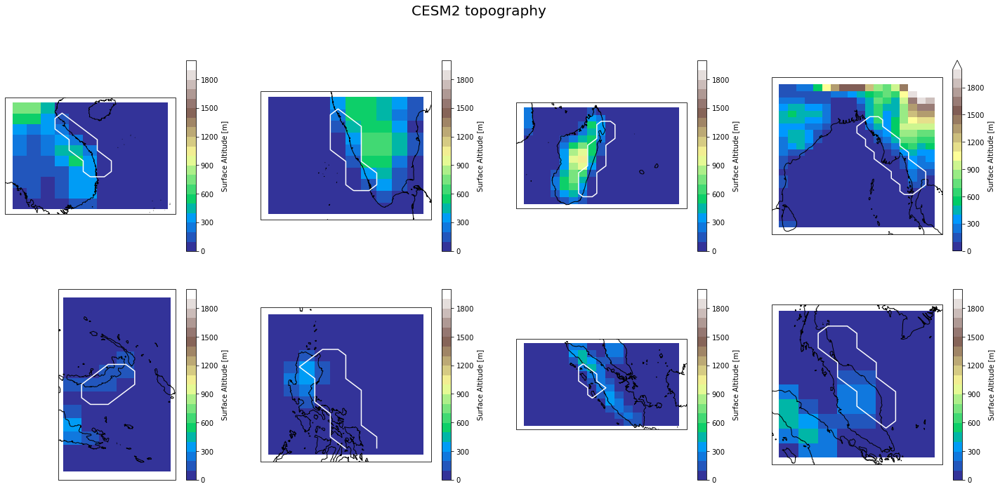

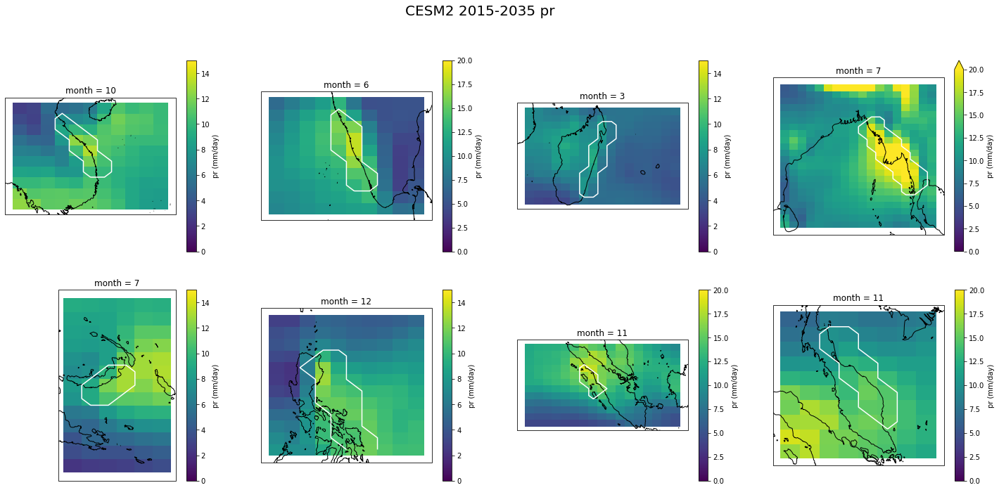

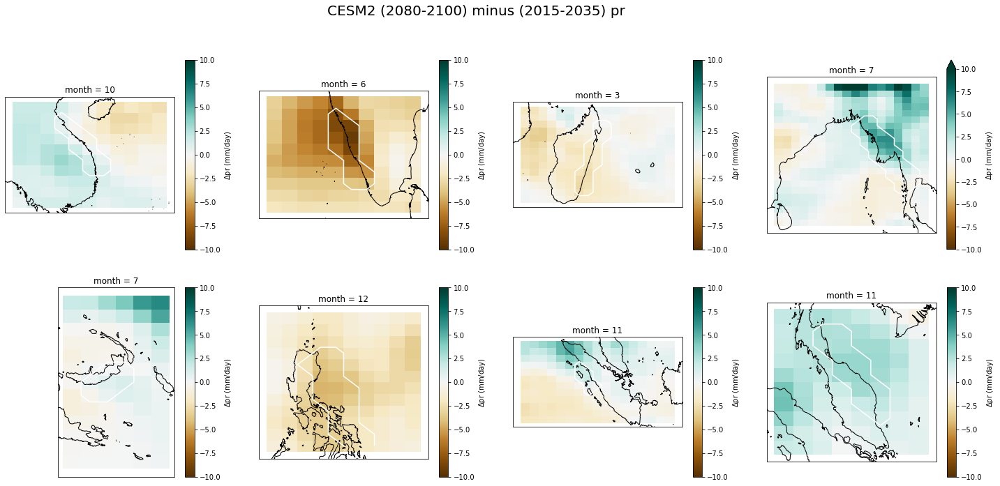

In [69]:
plot_topography_pr_deltapr(cesm2_orog,pr_cesm2_st,pr_cesm2_en,"CESM2")

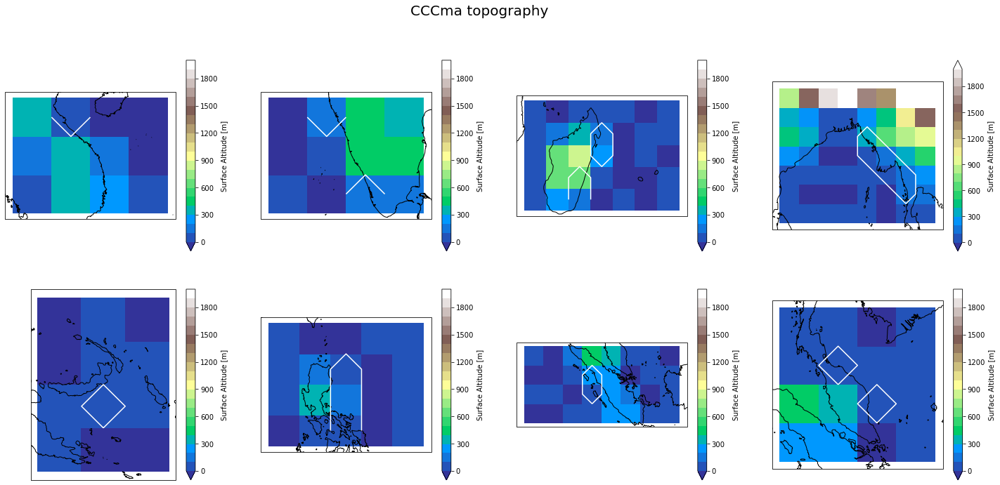

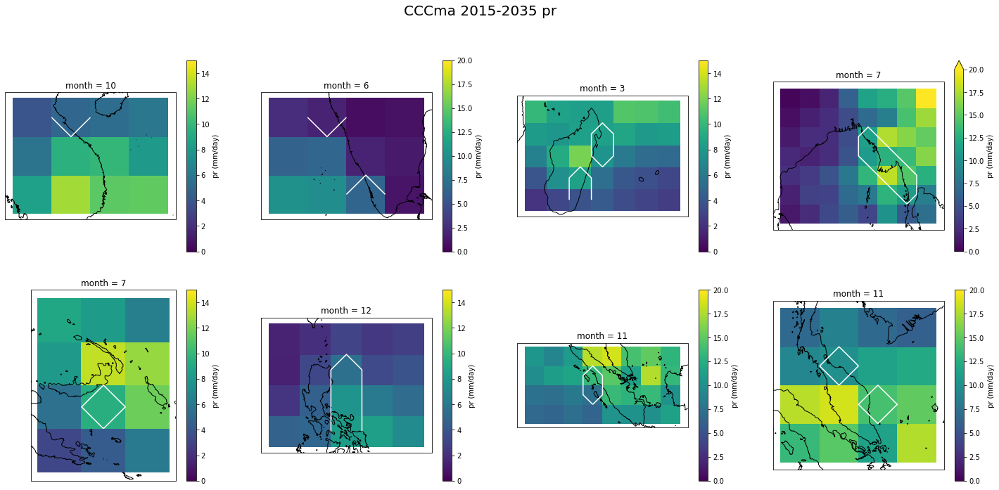

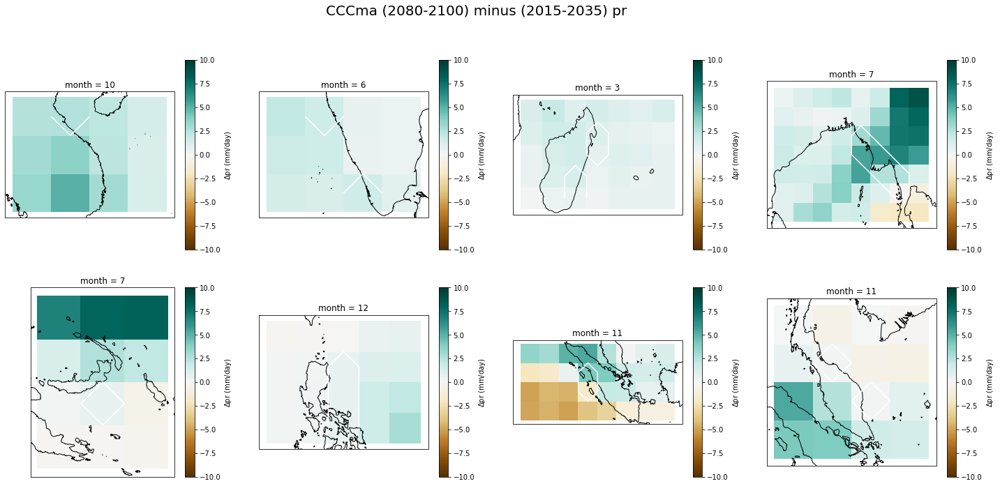

In [70]:
plot_topography_pr_deltapr(cccma_orog,pr_cccma_st,pr_cccma_en,"CCCma")

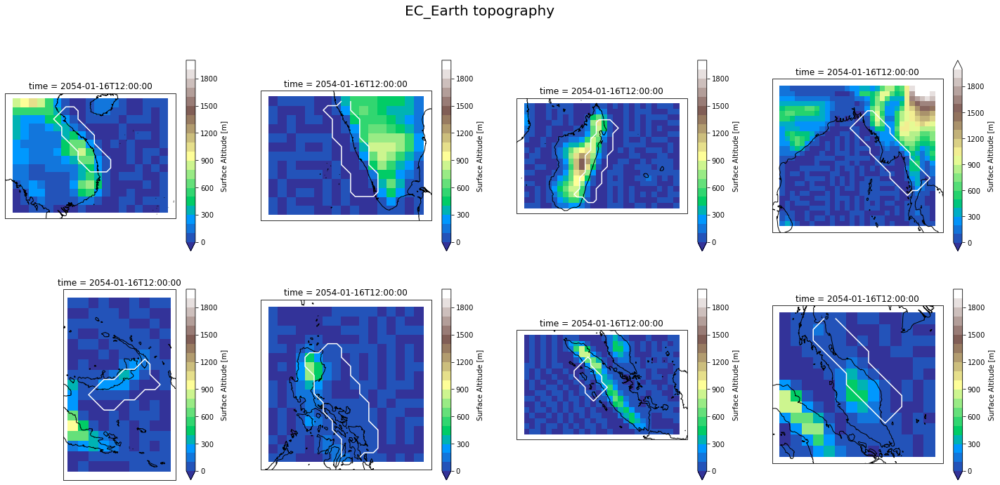

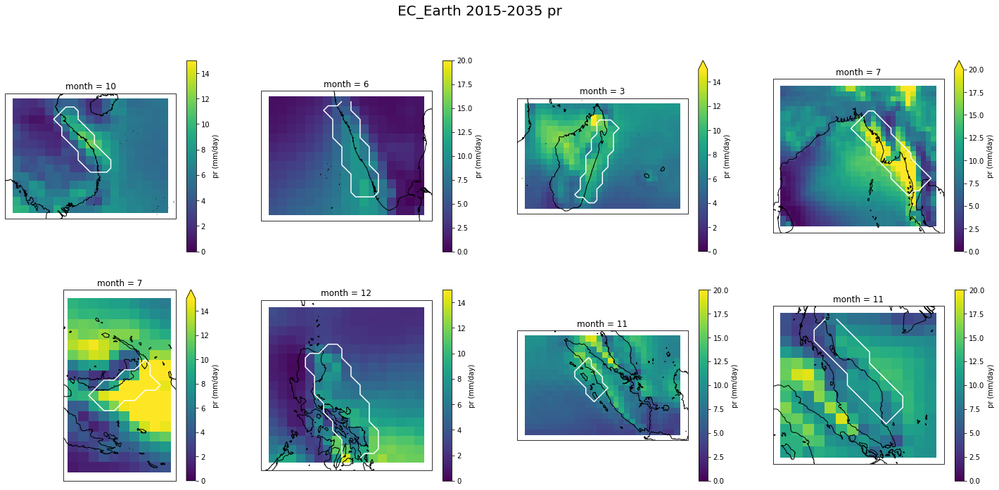

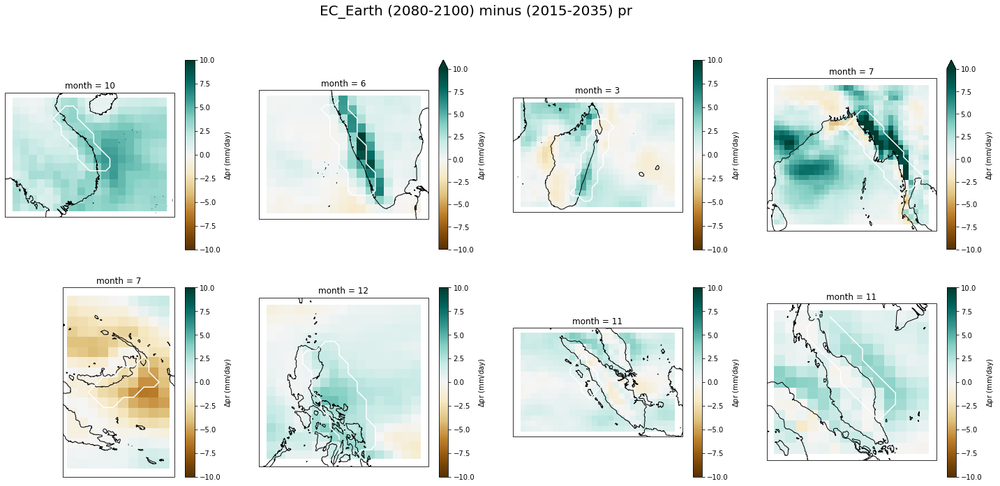

In [71]:
plot_topography_pr_deltapr(ecearth_orog,pr_ecearth_st,pr_ecearth_en,"EC-Earth")

## Trends

In [74]:
%%time
pr_SSP585_timeseries = [{name:86400*spatial_mean(pr_SSP585[i],mask=tilted_rect(pr_SSP585[i],*precip_boxes[name],reverse=False),lat='lat', lon='lon').mean('ensmember').load()
                          for name in mountains} 
                         for i in range(len(pr_SSP585))]

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


CPU times: user 10min 10s, sys: 1min 40s, total: 11min 51s
Wall time: 5min 53s


In [77]:
len(pr_SSP585_timeseries)

19

In [79]:
for i,mname in enumerate(modelnames_pr['Included models']):
    for name in mountains:
        filename="/global/cscratch1/sd/qnicolas/temp/"+mname+"_pr_%s_above.nc"%name
        if not os.path.exists(os.path.dirname(filename)):
            os.mkdir(os.path.dirname(filename))
        pr_SSP585_timeseries[i][name].to_netcdf(filename)
        

vietnam : 1.5039 %/decade
ghats : 0.0267 %/decade
madagascar : 0.1471 %/decade
myanmar : 1.5348 %/decade
newbritain : -1.7886 %/decade
philippines : 0.9852 %/decade
sumatra : 1.0152 %/decade
malaysia : 1.4002 %/decade


Text(0.5, 0.98, 'Precipitation change in eight tropical mountain regions under SSP585 forcing')

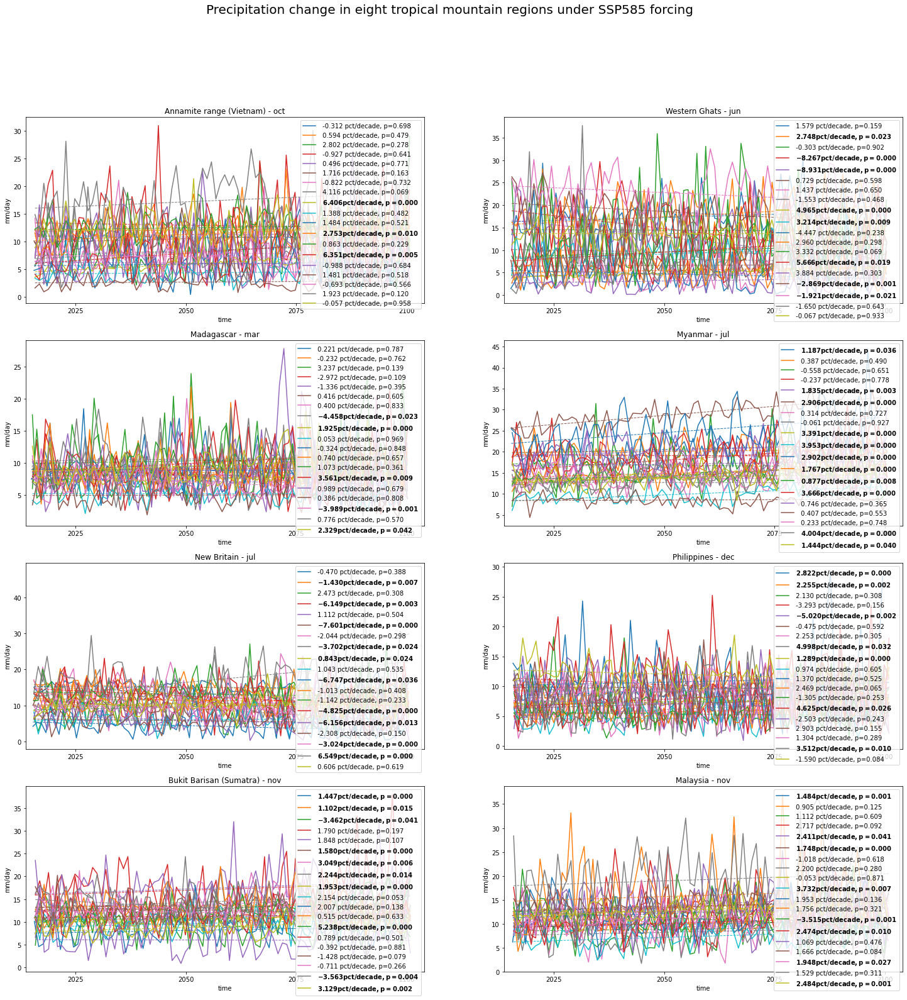

In [85]:
#%%time
fig,ax = plt.subplots(4,2,figsize=(25,25))
ax=ax.reshape(-1)
cycle=plt.rcParams["axes.prop_cycle"].by_key()["color"]
slopes = np.zeros(len(pr_SSP585_timeseries))
for a,name in zip(ax,mountains):
    for i,model in enumerate(pr_SSP585_timeseries):
        slopes[i] = plot_timeseries(model[name].sel(time=(model[name]['time.month']==mountains[name][3])),a,"",cycle[i%10],lw=1,unit='mm/day',sampling = 1,relative_change=True)#label=modelnamesu1[i]
    print("%s : %.4f %%/decade"%(name,np.nanmean(slopes)))
    a.legend()
    a.set_xlim(5000,38000)
    a.set_title(mountains[name][1]+' - ' + mnths[mountains[name][3]-1])
fig.suptitle("Precipitation change in eight tropical mountain regions under SSP585 forcing",fontsize=20)

vietnam : 0.1281 mm/day/decade
ghats : -0.0578 mm/day/decade
madagascar : 0.0264 mm/day/decade
myanmar : 0.2693 mm/day/decade
newbritain : -0.1328 mm/day/decade
philippines : 0.0691 mm/day/decade
sumatra : 0.1318 mm/day/decade
malaysia : 0.1701 mm/day/decade


Text(0.5, 0.98, 'Precipitation change in eight tropical mountain regions under SSP585 forcing')

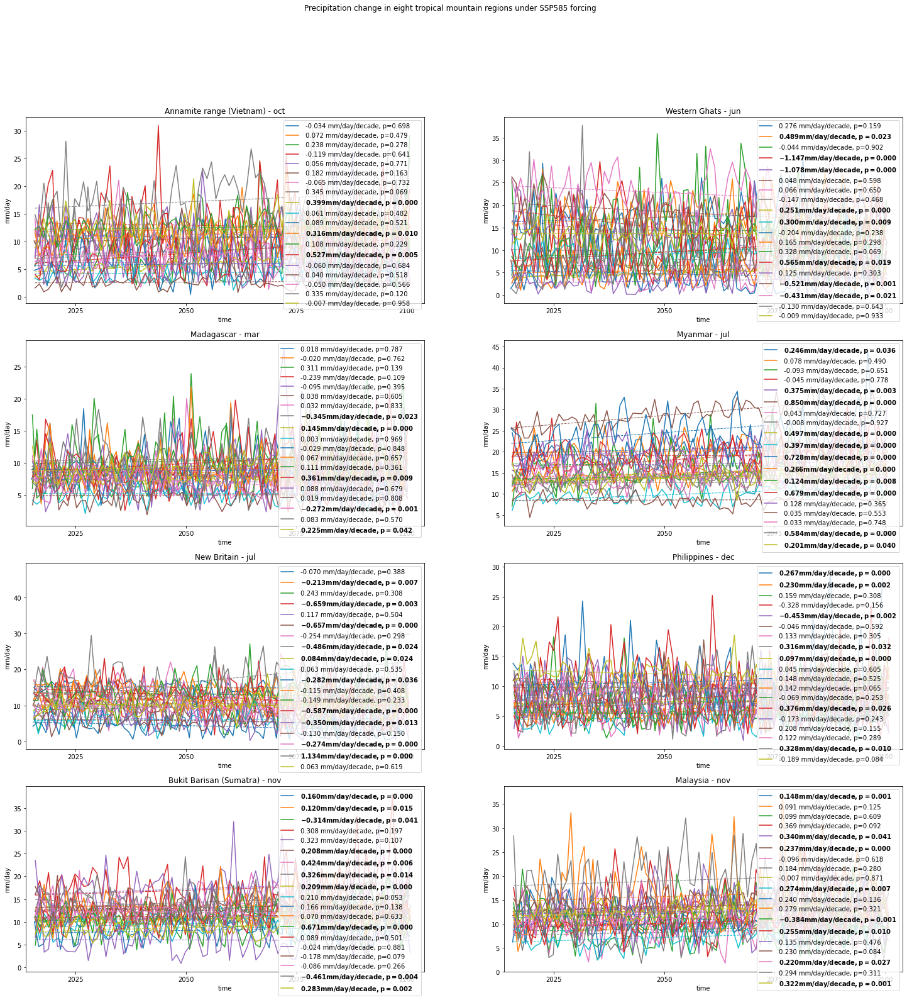

In [80]:
#%%time
fig,ax = plt.subplots(4,2,figsize=(25,25))
ax=ax.reshape(-1)
cycle=plt.rcParams["axes.prop_cycle"].by_key()["color"]
slopes = np.zeros(len(pr_SSP585_timeseries))
for a,name in zip(ax,mountains):
    for i,model in enumerate(pr_SSP585_timeseries):
        slopes[i] = plot_timeseries(model[name].sel(time=(model[name]['time.month']==mountains[name][3])),a,"",cycle[i%10],lw=1,unit='mm/day',sampling = 1,relative_change=True)#label=modelnamesu1[i]
    print("%s : %.4f mm/day/decade"%(name,np.nanmean(slopes)))
    a.legend()
    a.set_xlim(5000,38000)
    a.set_title(mountains[name][1]+' - ' + mnths[mountains[name][3]-1])
fig.suptitle("Precipitation change in eight tropical mountain regions under SSP585 forcing",fontsize=20)

# Wind trends

## CMIP SSP5-8.5

In [49]:
#%%time
#modellist, modelnames = checkModels('ScenarioMIP','ssp585','Amon','uas',1,False)#'CMIP','1pctCO2'
#modellist, modelnames = checkYears(modellist, modelnames,2015,2099,nminens=1,verbose=False)
#with open("/global/cscratch1/sd/qnicolas/temp/modellist_uas_2015_2100.txt","w") as f:
#    json.dump(modellist, f)
#modelnames.to_csv("/global/cscratch1/sd/qnicolas/temp/modelnames_uas_2015_2100.csv")


CPU times: user 14.6 s, sys: 1.19 s, total: 15.8 s
Wall time: 51.5 s


In [50]:
with open("/global/cscratch1/sd/qnicolas/temp/modellist_uas_2015_2100.txt","r") as f:
    modellist = json.load(f)
modelnames = pd.read_csv("/global/cscratch1/sd/qnicolas/temp/modelnames_uas_2015_2100.csv")

In [154]:
modellistv = [[[file.replace('uas','vas') for file in ens] for ens in model] for model in modellist]
modellistv1 = [[[file for file in ens if os.path.isfile(file)] for ens in model] for model in modellistv]
modellistv1 = [[ens for ens in model if len(ens)>0] for model in modellistv1 if len(model)>0]
modellistv1 = [model for model in modellistv1 if len(model)>0]

In [155]:
modellistu1 = [[[modellist[i][j][k] for k in range(len(modellist[i][j])) if os.path.isfile(modellistv[i][j][k])] for j in range(len(modellist[i]))] for i in range(len(modellist))]
modellistu1 = [[ens for ens in model if len(ens)>0] for model in modellistu1 if len(model)>0]
modellistu1 = [model for model in modellistu1 if len(model)>0]

In [187]:
modelnamesu1 = ['/'.join(model[0][0].split('/')[8:10]) for model in modellistu1]

In [160]:
%%time
uas_SSP585 = loadData(modellistu1,'uas',chunks={'time':50})
vas_SSP585 = loadData(modellistv1,'vas',chunks={'time':50})

CPU times: user 7.78 s, sys: 511 ms, total: 8.29 s
Wall time: 18.5 s


In [161]:
%%time
crossslopeflow_SSP585 = [{name:crossslopeflow(uas_SSP585[i].sel(lon=slice(mountains[name][0][0],mountains[name][0][1]),lat=slice(mountains[name][0][2],mountains[name][0][3])).mean('ensmember'),
                                              vas_SSP585[i].sel(lon=slice(mountains[name][0][0],mountains[name][0][1]),lat=slice(mountains[name][0][2],mountains[name][0][3])).mean('ensmember'),
                                              mountains[name][2]) 
                          for name in mountains} 
                         for i in range(len(uas_SSP585))]

CPU times: user 1.11 s, sys: 42.4 ms, total: 1.15 s
Wall time: 1.21 s


In [175]:
%%time
crossslopeflow_SSP585_timeseries = [{name:spatial_mean(crossslopeflow_SSP585[i][name],mask=tilted_rect(crossslopeflow_SSP585[i][name],*precip_boxes[name],reverse=True),lat='lat', lon='lon').load()
                                     for name in mountains} 
                                    for i in range(1)]#len(crossslopeflow_SSP585))]

CPU times: user 1min 9s, sys: 16 s, total: 1min 25s
Wall time: 1min 13s


In [178]:
%%time
crossslopeflow_SSP585_timeseries_all = [{name:spatial_mean(crossslopeflow_SSP585[i][name],mask=tilted_rect(crossslopeflow_SSP585[i][name],*precip_boxes[name],reverse=True),lat='lat', lon='lon').load()
                                     for name in mountains} 
                                    for i in range(len(crossslopeflow_SSP585))]

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in ar

CPU times: user 7min 49s, sys: 2min 22s, total: 10min 11s
Wall time: 7min 56s


CPU times: user 186 ms, sys: 8.16 ms, total: 194 ms
Wall time: 192 ms


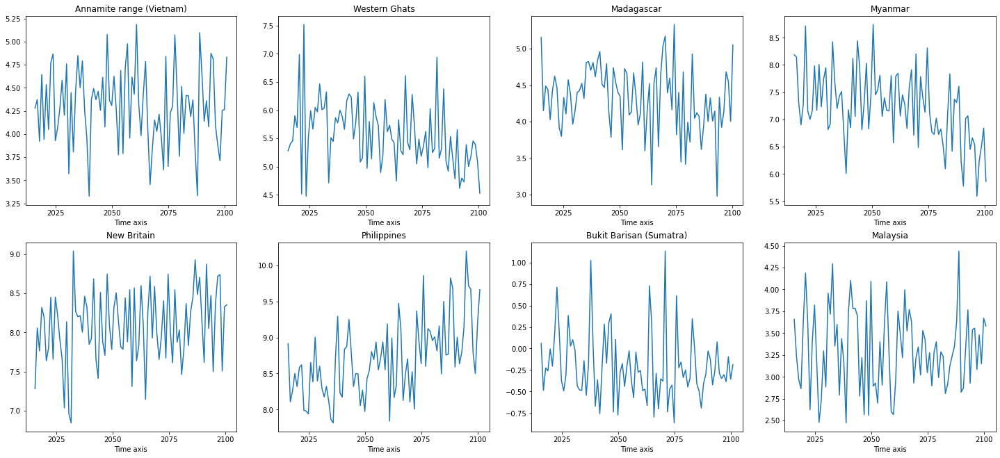

In [176]:
%%time
fig,ax = plt.subplots(2,4,figsize=(25,11))
ax=ax.reshape(-1)
for a,name in zip(ax,mountains):
    crossslopeflow_SSP585_timeseries[0][name].sel(time=(crossslopeflow_SSP585_timeseries[0][name]['time.month']==mountains[name][3])).plot(ax=a)
    a.set_title(mountains[name][1]+" "+mnths[mountains[name][3]-1])

CPU times: user 1.15 s, sys: 96 µs, total: 1.15 s
Wall time: 1.15 s


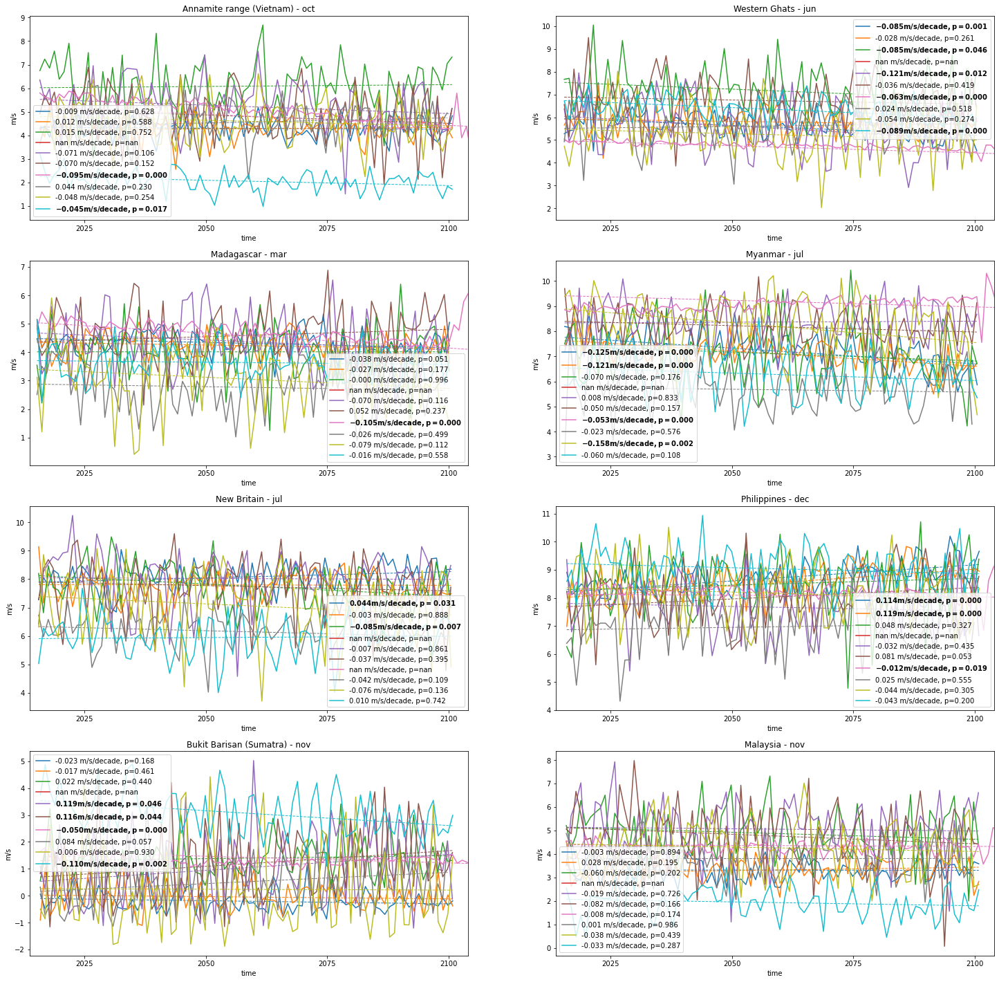

In [213]:
%%time
fig,ax = plt.subplots(4,2,figsize=(25,25))
ax=ax.reshape(-1)
cycle=plt.rcParams["axes.prop_cycle"].by_key()["color"]
for a,name in zip(ax,mountains):
    for i,model in enumerate(crossslopeflow_SSP585_timeseries_all):
        plot_timeseries(model[name].sel(time=(model[name]['time.month']==mountains[name][3])),a,"",cycle[i],lw=1,unit='m/s',sampling = 1)#label=modelnamesu1[i]
    a.legend()
    a.set_xlim(5000,38000)
    a.set_title(mountains[name][1]+' - ' + mnths[mountains[name][3]-1])

## HighResMIP 1pctCO2

In [214]:
%%time
modellist_hr, modelnames_hr = checkModels('HighResMIP','highresSST-future','Amon','uas',1,False)#'CMIP','1pctCO2'
modellist_hr, modelnames_hr = checkYears(modellist_hr, modelnames_hr,2015,2050,nminens=1,verbose=False)


CPU times: user 31.5 s, sys: 2.46 s, total: 33.9 s
Wall time: 1min 12s


In [223]:
modellist_hrv = [[[file.replace('uas','vas') for file in ens] for ens in model] for model in modellist_hr]
modellist_hrv1 = [[[file for file in ens if os.path.isfile(file)] for ens in model] for model in modellist_hrv]
modellist_hrv1 = [[ens for ens in model if len(ens)>0] for model in modellist_hrv1 if len(model)>0]
modellist_hrv1 = [model for model in modellist_hrv1 if len(model)>0]

In [224]:
modellist_hru1 = [[[modellist[i][j][k] for k in range(len(modellist_hr[i][j])) if os.path.isfile(modellist_hrv[i][j][k])] for j in range(len(modellist[i]))] for i in range(len(modellist))]
modellist_hru1 = [[ens for ens in model if len(ens)>0] for model in modellist_hru1 if len(model)>0]
modellist_hru1 = [model for model in modellist_hru1 if len(model)>0]

In [225]:
modelnames_hru1 = ['/'.join(model[0][0].split('/')[8:10]) for model in modellist_hru1]

In [229]:
%%time
uas_hrsstf = loadData(modellist_hru1,'uas')
vas_hrsstf = loadData(modellist_hrv1,'vas')

CPU times: user 1min 2s, sys: 4.18 s, total: 1min 6s
Wall time: 1min 43s


In [230]:
%%time
crossslopeflow_hrsstf = [{name:crossslopeflow(uas_hrsstf[i].sel(lon=slice(mountains[name][0][0],mountains[name][0][1]),lat=slice(mountains[name][0][2],mountains[name][0][3])).mean('ensmember'),
                                              vas_hrsstf[i].sel(lon=slice(mountains[name][0][0],mountains[name][0][1]),lat=slice(mountains[name][0][2],mountains[name][0][3])).mean('ensmember'),
                                              mountains[name][2]) 
                          for name in mountains} 
                         for i in range(len(uas_hrsstf))]

CPU times: user 1.53 s, sys: 15.6 ms, total: 1.54 s
Wall time: 1.68 s


In [231]:
%%time
crossslopeflow_hrsstf_timeseries = [{name:spatial_mean(crossslopeflow_hrsstf[i][name],mask=tilted_rect(crossslopeflow_hrsstf[i][name],*precip_boxes[name],reverse=True),lat='lat', lon='lon').load()
                                     for name in mountains} 
                                    for i in range(1)]

CPU times: user 30 s, sys: 6.62 s, total: 36.6 s
Wall time: 29.3 s


In [ ]:
%%time
crossslopeflow_hrsstf_timeseries_all = [{name:spatial_mean(crossslopeflow_hrsstf[i][name],mask=tilted_rect(crossslopeflow_hrsstf[i][name],*precip_boxes[name],reverse=True),lat='lat', lon='lon').load()
                                     for name in mountains} 
                                    for i in range(len(crossslopeflow_hrsstf))]

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in ar

CPU times: user 156 ms, sys: 3.95 ms, total: 160 ms
Wall time: 161 ms


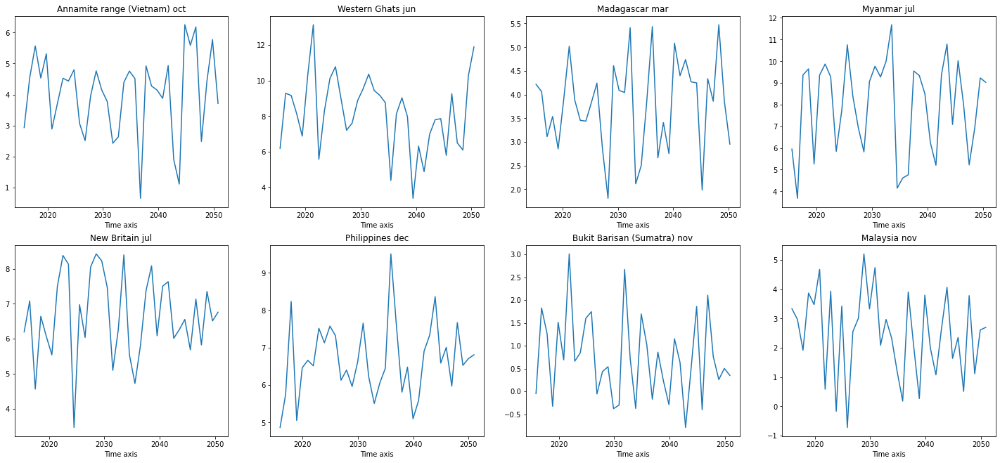

In [232]:
%%time
fig,ax = plt.subplots(2,4,figsize=(25,11))
ax=ax.reshape(-1)
for a,name in zip(ax,mountains):
    crossslopeflow_hrsstf_timeseries[0][name].sel(time=(crossslopeflow_hrsstf_timeseries[0][name]['time.month']==mountains[name][3])).plot(ax=a)
    a.set_title(mountains[name][1]+" "+mnths[mountains[name][3]-1])

# Humidity / static stability trends

## Humidity

In [51]:
#%%time
#modellist_hus, modelnames_hus = checkModels('ScenarioMIP','ssp585','Amon','hus',1,False)#'CMIP','1pctCO2'
#modellist_hus, modelnames_hus = checkYears(modellist_hus, modelnames_hus,2015,2099,nminens=1,verbose=False)
#del modellist_hus[7]
#modelnames_hus = modelnames_hus.drop(7)
#with open("/global/cscratch1/sd/qnicolas/temp/modellist_hus_2015_2100.txt","w") as f:
#    json.dump(modellist_hus, f)
#modelnames_hus.to_csv("/global/cscratch1/sd/qnicolas/temp/modelnames_hus_2015_2100.csv")

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'hus' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'hus' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,


CPU times: user 16.7 s, sys: 1.67 s, total: 18.4 s
Wall time: 1min 24s


In [77]:
with open("/global/cscratch1/sd/qnicolas/temp/modellist_hus_2015_2100.txt","r") as f:
    modellist_hus = json.load(f)
modelnames_hus = pd.read_csv("/global/cscratch1/sd/qnicolas/temp/modelnames_hus_2015_2100.csv")

In [83]:
#%%time
with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    hus_SSP585 = loadData(modellist_hus,'hus',chunks={'time':10})

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'hus' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'hus' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,


In [ ]:
%%time
hus_SSP585_timeseries=[]
for mname,husm in list(zip(modelnames['Included models'],hus_SSP585)):
    print(mname)
    hus_SSP585_timeseries.append({})
    for name in mountains:
        print(name, end=' ')
        mask=tilted_rect(husm,*precip_boxes[name],reverse=True)
        tbsaved=((husm*mask).mean('ensmember').sum(['lat','lon'])/mask.sum(['lat','lon']))
        filename="/global/cscratch1/sd/qnicolas/temp/"+mname+"_hus_%s_upstream.nc"%name
        if not os.path.exists(os.path.dirname(filename)):
            os.mkdir(os.path.dirname(filename))
        tbsaved.to_netcdf(filename)
    print('')
    

In [87]:
hus_allmodels = []
for mname in modelnames_hus['Included models']:
    hus_allmodels.append({})
    for name in mountains:
        filename="/global/cscratch1/sd/qnicolas/temp/"+mname+"_hus_%s_upstream.nc"%name
        temp = xr.open_dataarray(filename)
        if type(np.array(temp.time)[0]) != np.datetime64:
            temp['time'] = temp.indexes['time'].to_datetimeindex()
        hus_allmodels[-1][name] = temp
    

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, '360_day', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  


vietnam : 0.330 g/kg/decade
ghats : 0.356 g/kg/decade
madagascar : 0.327 g/kg/decade
myanmar : 0.352 g/kg/decade
newbritain : 0.262 g/kg/decade
philippines : 0.314 g/kg/decade
sumatra : 0.309 g/kg/decade
malaysia : 0.348 g/kg/decade


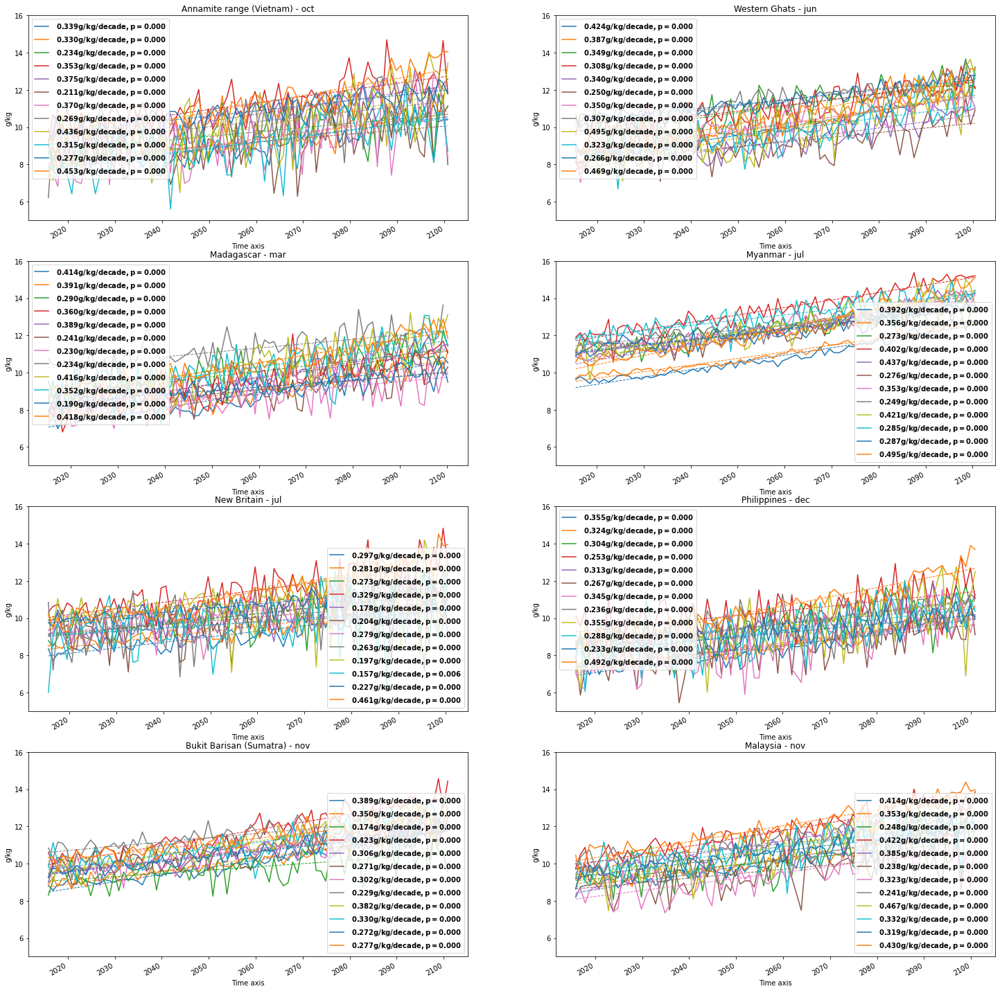

In [88]:
#%%time
fig,ax = plt.subplots(4,2,figsize=(25,25))
ax=ax.reshape(-1)
cycle=plt.rcParams["axes.prop_cycle"].by_key()["color"]
slopes = np.zeros(len(hus_allmodels))
for a,name in zip(ax,mountains):
    for i,model in enumerate(hus_allmodels):
        ts=model[name].sel(time=(model[name]['time.month']==mountains[name][3]),plev=slice(9e4,7e4)).mean('plev')
        slopes[i] = plot_timeseries(ts*1e3,a,"",cycle[i%10],lw=1,unit='g/kg',sampling = 1)#label=modelnamesu1[i]
    print("%s : %.3f g/kg/decade"%(name,slopes.mean()))
    a.legend()
    a.set_title(mountains[name][1]+' - ' + mnths[mountains[name][3]-1])
    a.set_ylim(5,16)

## Stat. stability

In [53]:
#%%time
#modellist_ta, modelnames_ta = checkModels('ScenarioMIP','ssp585','Amon','ta',1,False)#'CMIP','1pctCO2'
#modellist_ta, modelnames_ta = checkYears(modellist_ta, modelnames_ta,2015,2099,nminens=1,verbose=False)
#del modellist_ta[8]
#modelnames_ta = modelnames_ta.drop(8)
#with open("/global/cscratch1/sd/qnicolas/temp/modellist_ta_2015_2100.txt","w") as f:
#    json.dump(modellist_hus, f)
#modelnames_hus.to_csv("/global/cscratch1/sd/qnicolas/temp/modelnames_ta_2015_2100.csv")


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'ta' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'ta' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,


CPU times: user 16 s, sys: 1.42 s, total: 17.4 s
Wall time: 1min 34s


In [89]:
with open("/global/cscratch1/sd/qnicolas/temp/modellist_ta_2015_2100.txt","r") as f:
    modellist_hus = json.load(f)
modelnames_hus = pd.read_csv("/global/cscratch1/sd/qnicolas/temp/modelnames_ta_2015_2100.csv")

In [90]:
%%time
with dask.config.set(**{'array.slicing.split_large_chunks': False}):
    ta_SSP585 = loadData(modellist_ta,'ta',chunks={'time':10})
ta_SSP585[9] = ta_SSP585[9].rename(latitude='lat',longitude='lon')

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'ta' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'ta' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,


CPU times: user 5.68 s, sys: 1.33 s, total: 7.02 s
Wall time: 26.8 s


In [ ]:
%%time
ta_SSP585_timeseries=[]
for mname,tam in list(zip(modelnames_ta['Included models'],ta_SSP585))[9:]:
    print(mname)
    ta_SSP585_timeseries.append({})
    for name in mountains:
        print(name, end=' ')
        mask=tilted_rect(tam,*precip_boxes[name],reverse=True)
        tbsaved=((tam*mask).mean('ensmember').sum(['lat','lon'])/mask.sum(['lat','lon']))
        filename="/global/cscratch1/sd/qnicolas/temp/"+mname+"_ta_%s_upstream.nc"%name
        if not os.path.exists(os.path.dirname(filename)):
            os.mkdir(os.path.dirname(filename))
        tbsaved.to_netcdf(filename)
    print('')
    

In [91]:
ta_allmodels = []
for mname in modelnames_ta['Included models']:
    print(mname)
    ta_allmodels.append({})
    for name in mountains:
        filename="/global/cscratch1/sd/qnicolas/temp/"+mname+"_ta_%s_upstream.nc"%name
        temp = xr.open_dataarray(filename)[:1032]
        if type(np.array(temp.time)[0]) != np.datetime64:
            temp['time'] = temp.indexes['time'].to_datetimeindex()
        ta_allmodels[-1][name] = temp
    

CNRM-CERFACS/CNRM-CM6-1-HR
CNRM-CERFACS/CNRM-CM6-1
CNRM-CERFACS/CNRM-ESM2-1
BCC/BCC-CSM2-MR


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, 'noleap', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  if __name__ == '__main__':


NCAR/CESM2
MOHC/UKESM1-0-LL


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: Converting a CFTimeIndex with dates from a non-standard calendar, '360_day', to a pandas.DatetimeIndex, which uses dates from the standard calendar.  This may lead to subtle errors in operations that depend on the length of time between dates.
  if __name__ == '__main__':


NOAA-GFDL/GFDL-ESM4
NOAA-GFDL/GFDL-CM4
CAMS/CAMS-CSM1-0
UA/MCM-UA-1-0
NIMS-KMA/KACE-1-0-G
EC-Earth-Consortium/EC-Earth3-Veg
MRI/MRI-ESM2-0


/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/coding/times.py:463: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/numpy/core/_asarray.py:83: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return array(a, dtype, copy=False, order=order)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/coding/times.py:463: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/global/homes/q/qni

NUIST/NESM3
MIROC/MIROC-ES2L
MIROC/MIROC6
IPSL/IPSL-CM6A-LR


In [5]:
def compute_N(T,pfactor,pname='pressure'):
    """T in K, p in Pa and N in s"""
    g = 9.81; R=287.
    rho = pfactor*T[pname]/R/T
    theta = T*(pfactor*T[pname]/1e5)**(-0.287)
    return np.sqrt(-rho*g*g/theta*theta.differentiate(pname)/pfactor)

vietnam : 3.0e-05 s^-1/decade
ghats : 4.9e-05 s^-1/decade
madagascar : 4.9e-05 s^-1/decade
myanmar : 4.0e-05 s^-1/decade
newbritain : 5.2e-05 s^-1/decade
philippines : 4.8e-05 s^-1/decade
sumatra : 4.9e-05 s^-1/decade
malaysia : 4.3e-05 s^-1/decade


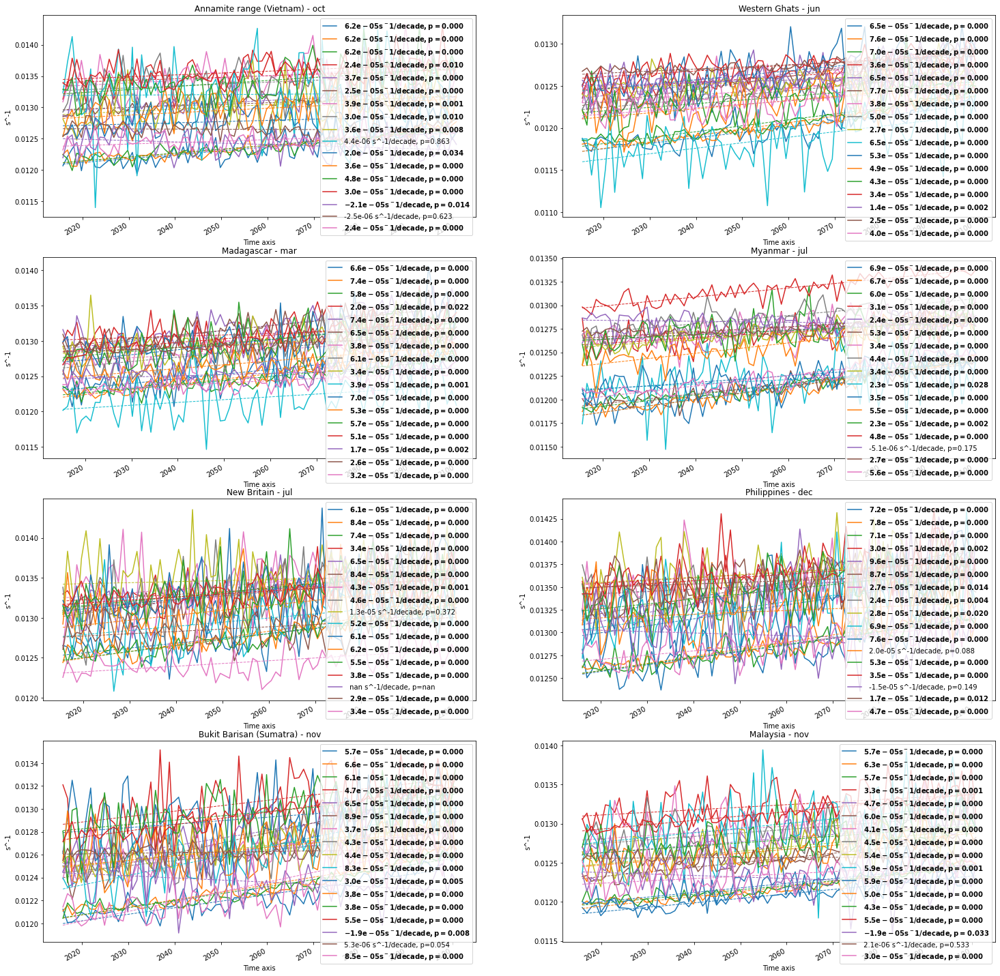

In [94]:
#%%time
import warnings
slopes = np.zeros(len(ta_allmodels))
with warnings.catch_warnings():
    warnings.simplefilter("ignore",RuntimeWarning)
    fig,ax = plt.subplots(4,2,figsize=(25,25))
    ax=ax.reshape(-1)
    cycle=plt.rcParams["axes.prop_cycle"].by_key()["color"]
    for a,name in zip(ax,mountains):
        for i,model in enumerate(ta_allmodels):
            ts=compute_N(model[name].sel(time=(model[name]['time.month']==mountains[name][3])),1.,pname='plev').sel(plev=slice(9e4,7e4)).mean('plev')
            slopes[i] = plot_timeseries(ts,a,"",cycle[i%10],lw=1,unit='s^-1',print_float='e',sampling = 1)#label=modelnamesu1[i]
        print("%s : %.1e s^-1/decade"%(name,np.nanmean(slopes)))
        a.legend()
        a.set_title(mountains[name][1]+' - ' + mnths[mountains[name][3]-1])

# Surface temp change

In [55]:
modellist_tas = [[[file.replace('ta','tas') for file in ens] for ens in model] for model in modellist_ta]
modellist_tas1 = [[[file for file in ens if os.path.isfile(file)] for ens in model] for model in modellist_tas]
modellist_tas1 = [[ens for ens in model if len(ens)>0] for model in modellist_tas1 if len(model)>0]
modellist_tas1 = [model for model in modellist_tas1 if len(model)>0]

In [60]:
%%time
tas_SSP585 = loadData(modellist_tas1,'tas',chunks={'time':50})
tas_SSP585[6]=tas_SSP585[6].rename(latitude='lat',longitude='lon')

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'tas' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/conventions.py:500: SerializationWarning: variable 'tas' has multiple fill values {1e+20, 1e+20}, decoding all values to NaN.
  decode_timedelta=decode_timedelta,


CPU times: user 3.75 s, sys: 969 ms, total: 4.71 s
Wall time: 11.1 s


In [67]:
%%time
tas_SSP585_timeseries = [{name:spatial_mean(tas_SSP585[i],mask=tilted_rect(tas_SSP585[i],*precip_boxes[name],reverse=True),lat='lat', lon='lon').mean('ensmember').load()
                          for name in mountains} 
                         for i in range(len(tas_SSP585))]

/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)
/global/homes/q/qnicolas/.conda/envs/era5/lib/python3.7/site-packages/xarray/core/computation.py:724: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


CPU times: user 4min 36s, sys: 17.3 s, total: 4min 53s
Wall time: 2min 45s


vietnam : 0.49 K/decade
ghats : 0.49 K/decade
madagascar : 0.47 K/decade
myanmar : 0.46 K/decade
newbritain : 0.42 K/decade
philippines : 0.42 K/decade
sumatra : 0.44 K/decade
malaysia : 0.45 K/decade


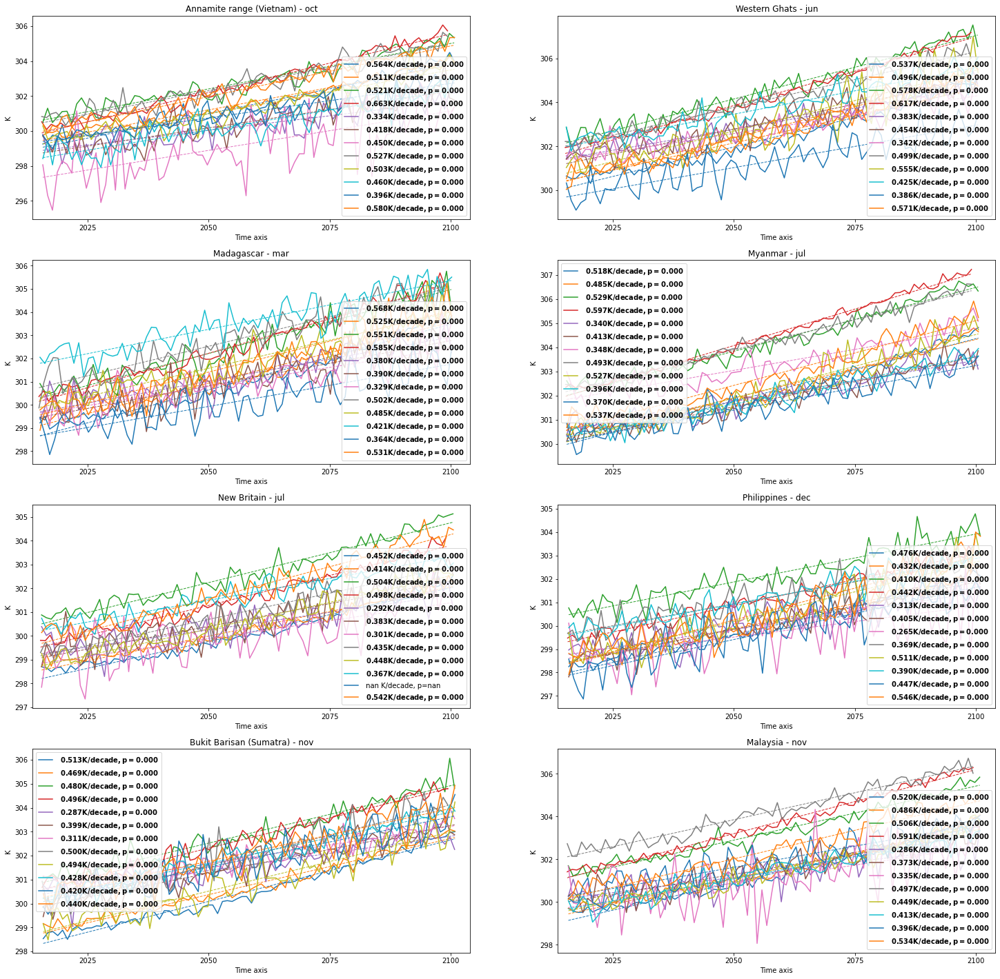

In [96]:
#%%time
fig,ax = plt.subplots(4,2,figsize=(25,25))
ax=ax.reshape(-1)
cycle=plt.rcParams["axes.prop_cycle"].by_key()["color"]
slopes = np.zeros(len(tas_SSP585_timeseries))
for a,name in zip(ax,mountains):
    for i,model in enumerate(tas_SSP585_timeseries):
        slopes[i] = plot_timeseries(model[name].sel(time=(model[name]['time.month']==mountains[name][3])),a,"",cycle[i%10],lw=1,unit='K',sampling = 1)#label=modelnamesu1[i]
    print("%s : %.2f K/decade"%(name,np.nanmean(slopes)))
    a.legend()
    a.set_xlim(5000,38000)
    a.set_title(mountains[name][1]+' - ' + mnths[mountains[name][3]-1])

# Changes in static stability in theory

In [11]:
import metpy.calc as mpcalc
from metpy.units import units

In [13]:
ps_ref = np.arange(10,1001,10)[::-1]

(1010.0, 0.0)

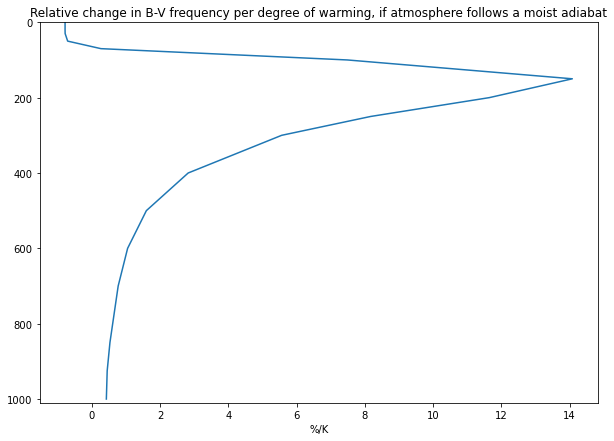

In [268]:
plt.figure(figsize=(10,7))
T_m    = xr.DataArray(np.array(mpcalc.moist_lapse(ps_ref*units.hPa,300.*units.K,ref_pressure=1001*units.hPa)/units.K),coords={'plev':ps_ref*100},dims=['plev'])
T_m_p1 = xr.DataArray(np.array(mpcalc.moist_lapse(ps_ref*units.hPa,301.*units.K,ref_pressure=1001*units.hPa)/units.K),coords={'plev':ps_ref*100},dims=['plev'])
N_m    = compute_N(T_m,1,pname='plev')
N_m_p1 = compute_N(T_m_p1,1,pname='plev')
dlnNdT = 100*(N_m_p1-N_m)/N_m
plt.plot(dlnNdT,ps_ref)
plt.title("Relative change in B-V frequency per degree of warming, if atmosphere follows a moist adiabat")
plt.xlabel("%/K")
plt.ylim(1010,0)

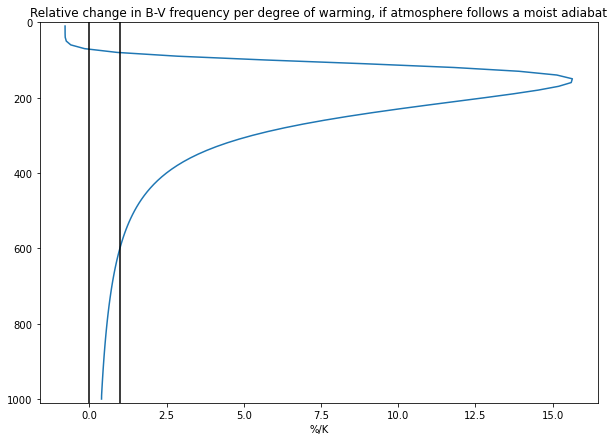

In [15]:
plt.figure(figsize=(10,7))
T_m    = xr.DataArray(np.array(mpcalc.moist_lapse(ps_ref*units.hPa,300.*units.K,ref_pressure=1001*units.hPa)/units.K),coords={'plev':ps_ref*100},dims=['plev'])
T_m_p1 = xr.DataArray(np.array(mpcalc.moist_lapse(ps_ref*units.hPa,301.*units.K,ref_pressure=1001*units.hPa)/units.K),coords={'plev':ps_ref*100},dims=['plev'])
N_m    = compute_N(T_m,1,pname='plev')
N_m_p1 = compute_N(T_m_p1,1,pname='plev')
dlnNdT = 100*(N_m_p1-N_m)/N_m
plt.plot(dlnNdT,ps_ref)
plt.title("Relative change in B-V frequency per degree of warming, if atmosphere follows a moist adiabat")
plt.xlabel("%/K")
plt.ylim(1010,0)
plt.axvline(0.,color='k')
plt.axvline(1.,color='k')